In [1]:
import cv2
import pandas as pd
import os.path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from sklearn.cluster import KMeans

In [2]:
imgdir="images2"

In [3]:
df = pd.read_csv('df_nonLinear.csv').drop(columns='Unnamed: 0')
df = df[df.Artwork_Image.notna()]
# replace url_prefix with imgdir (this is where we downloaded the images)
url_prefix = 'http://artinfo-images-350.s3.amazonaws.com'
df['Artwork_Image_Path'] = df.Artwork_Image.apply(lambda x: x.replace(url_prefix, imgdir))
# keep the rows if we have images
df = df[df.Artwork_Image_Path.map(lambda x: os.path.exists(x))]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7897 entries, 4 to 9375
Data columns (total 36 columns):
Artist_Name              7897 non-null object
Auction_Year             7897 non-null int64
Lot_ID                   7897 non-null int64
Artwork_Image            7897 non-null object
Lot_No                   7896 non-null float64
Status                   7897 non-null object
Lot_Estimate_Low_USD     7590 non-null float64
Lot_Estimate_High_USD    7611 non-null float64
SalePrice_USD            7897 non-null int64
Auction_Title            7897 non-null object
Auction_Date             7897 non-null object
Price_Type               7897 non-null object
Artwork_Width            7897 non-null float64
Artwork_Height           7897 non-null float64
Artwork_Year_Start       5892 non-null float64
Painting_Title           7897 non-null object
Provenance               7897 non-null object
Literature               7897 non-null object
Aspect_Ratio             7897 non-null float64
Orientation    

In [4]:
def _mean(im): return [im[:,:,0].mean(), im[:,:,1].mean(), im[:,:,2].mean()]

In [5]:
# opencv read in BGR, we convert it to RGB and take mean for every channel
df_rgb = df.Artwork_Image_Path.apply(lambda imgpath: pd.Series(
                                 [imgpath] + _mean(cv2.cvtColor(cv2.imread(imgpath), cv2.COLOR_BGR2RGB)), 
                                 index="Artwork_Image_Path r g b".split()))
# LAB
df_lab = df.Artwork_Image_Path.apply(lambda imgpath: pd.Series(
                                 [imgpath] + _mean(cv2.cvtColor(cv2.imread(imgpath), cv2.COLOR_BGR2LAB)), 
                                 index="Artwork_Image_Path l a b".split()))
# HSV
df_hsv = df.Artwork_Image_Path.apply(lambda imgpath: pd.Series(
                                 [imgpath] + _mean(cv2.cvtColor(cv2.imread(imgpath), cv2.COLOR_BGR2HSV)), 
                                 index="Artwork_Image_Path h s v".split()))

In [6]:
df_rgb.describe().join(df_lab.describe(), rsuffix="_lab").join(df_hsv.describe()).round(2)

,r,g,b,l,a,b_lab,h,s,v
count,7897.00,7897.00,7897.00,7897.00,7897.00,7897.00,7897.00,7897.00,7897.00
mean,127.53,111.37,94.64,121.50,133.17,140.16,46.10,94.86,135.85
std,44.31,42.26,42.97,41.18,9.55,12.77,27.55,46.80,41.67
min,0.62,0.57,0.61,0.61,88.98,75.50,0.00,0.00,0.63
25%,95.74,79.89,61.78,92.08,127.74,132.08,24.38,59.32,105.93
50%,127.07,108.19,88.03,119.52,131.03,138.86,39.20,90.65,135.58
75%,158.84,139.95,122.38,149.29,136.76,146.99,62.09,125.57,165.46
max,249.01,246.85,243.70,247.71,184.87,206.76,166.71,252.86,249.03


In [7]:
# compute k-mean
kmeans_rgb = KMeans(n_clusters=8, random_state=0).fit(df_rgb[['r','g','b']])
kmeans_lab = KMeans(n_clusters=8, random_state=0).fit(df_lab[['l','a','b']])
kmeans_hsv = KMeans(n_clusters=8, random_state=0).fit(df_hsv[['h','s','v']])

In [8]:
pd.DataFrame.from_records({
    "RGB": [kmeans_rgb.n_iter_, kmeans_rgb.max_iter, kmeans_rgb.n_iter_ < kmeans_rgb.max_iter], 
    "LAB": [kmeans_lab.n_iter_, kmeans_lab.max_iter, kmeans_lab.n_iter_ < kmeans_lab.max_iter], 
    "HSV": [kmeans_hsv.n_iter_, kmeans_hsv.max_iter, kmeans_hsv.n_iter_ < kmeans_hsv.max_iter]},
 index=['n_iter','max_iter','converged']).T

,n_iter,max_iter,converged
HSV,21,300,True
LAB,40,300,True
RGB,24,300,True


In [9]:
# algo params
pd.DataFrame.from_records([kmeans_hsv.get_params(),kmeans_lab.get_params(),kmeans_rgb.get_params()],
                          index="HSV LAB RGB".split())

,algorithm,copy_x,init,max_iter,n_clusters,n_init,n_jobs,precompute_distances,random_state,tol,verbose
HSV,auto,True,k-means++,300,8,10,None,auto,0,0.0001,0
LAB,auto,True,k-means++,300,8,10,None,auto,0,0.0001,0
RGB,auto,True,k-means++,300,8,10,None,auto,0,0.0001,0


In [10]:
# center of each cluster
pd.DataFrame.from_records({
    'HSV':map(lambda x: tuple(x), kmeans_hsv.cluster_centers_.round(1)),
    'LAB':map(lambda x: tuple(x), kmeans_lab.cluster_centers_.round(1)),
    'RGB':map(lambda x: tuple(x), kmeans_rgb.cluster_centers_.round(1))},
index=pd.Index(range(8),name='label'))

,HSV,LAB,RGB
label,,,
0,"(34.9, 46.9, 192.4)","(168.9, 129.8, 141.4)","(177.3, 165.8, 146.9)"
1,"(37.3, 99.3, 97.3)","(112.5, 130.2, 136.9)","(126.6, 79.0, 53.1)"
2,"(33.8, 159.6, 111.4)","(139.8, 129.3, 135.2)","(143.0, 136.4, 123.7)"
3,"(31.5, 175.9, 178.0)","(83.5, 132.3, 135.7)","(83.6, 80.3, 72.6)"
4,"(69.0, 56.5, 77.6)","(52.2, 133.4, 131.9)","(171.7, 122.9, 73.6)"
5,"(33.9, 107.1, 157.2)","(139.2, 140.8, 160.2)","(116.1, 108.4, 95.3)"
6,"(94.3, 126.2, 119.7)","(202.2, 128.9, 137.6)","(206.3, 200.5, 190.5)"
7,"(52.6, 52.4, 137.6)","(101.3, 148.8, 153.0)","(61.5, 48.9, 42.3)"


In [11]:
# how many items in each cluster
def _uniq(arr):
    label, count = np.unique(arr, return_counts=True)
    return dict(zip(label, count))

pd.DataFrame({
    'HSV':_uniq(kmeans_hsv.labels_),
    'LAB':_uniq(kmeans_lab.labels_),
    'RGB':_uniq(kmeans_rgb.labels_)}).T

,0,1,2,3,4,5,6,7
HSV,1119,1239,754,559,742,1458,686,1340
LAB,1087,1510,1218,1388,735,717,553,689
RGB,941,942,1248,1284,709,1479,428,866


In [12]:
def _join(_df, _km, _cols):
    return _df.join(pd.DataFrame.from_records(
        map(lambda x: [x] + _km.cluster_centers_[x].tolist(), _km.labels_),
        index=_df.index, 
        columns=_cols))

df_rgb_km = _join(df_rgb, kmeans_rgb, ['cluster','center_r','center_g','center_b'])
df_hsv_km = _join(df_hsv, kmeans_hsv, ['cluster','center_h','center_s','center_v'])
df_lab_km = _join(df_lab, kmeans_lab, ['cluster','center_l','center_a','center_b'])

In [13]:
df_rgb_km.head()

,Artwork_Image_Path,r,g,b,cluster,center_r,center_g,center_b
4,images2/asi2-125006/17.jpg,97.616457,83.346417,69.423588,3,83.621872,80.343443,72.634032
5,images2/asi2-129104/26.jpg,77.174306,69.588160,61.303569,3,83.621872,80.343443,72.634032
8,images2/missingImages/0887180/63.jpg,142.481608,130.763371,114.554547,2,142.993349,136.363558,123.710920
10,images2/asi2-129104/25.jpg,163.368343,127.608663,71.316561,4,171.663909,122.868703,73.622093
12,images2/asi2-120614/58.jpg,114.306907,113.881531,102.117063,5,116.113770,108.375603,95.345713


In [14]:
df_hsv_km.head()

,Artwork_Image_Path,h,s,v,cluster,center_h,center_s,center_v
4,images2/asi2-125006/17.jpg,47.932221,94.776522,107.471223,1,37.270782,99.310923,97.305709
5,images2/asi2-129104/26.jpg,45.182083,59.432007,79.465931,4,69.032894,56.521758,77.591238
8,images2/missingImages/0887180/63.jpg,14.372963,74.861233,142.523820,5,33.901977,107.136903,157.208281
10,images2/asi2-129104/25.jpg,19.852599,137.250042,163.661602,5,33.901977,107.136903,157.208281
12,images2/asi2-120614/58.jpg,45.271322,75.503614,119.169960,7,52.569798,52.425517,137.635595


In [15]:
df_lab_km.head()

,Artwork_Image_Path,l,a,b,cluster,center_l,center_a,center_b
4,images2/asi2-125006/17.jpg,94.202171,132.639017,139.310080,3,83.469562,132.296585,135.682157
5,images2/asi2-129104/26.jpg,76.004743,129.923076,134.105167,3,83.469562,132.296585,135.682157
8,images2/missingImages/0887180/63.jpg,136.610898,130.476971,139.293404,2,139.778369,129.268327,135.154272
10,images2/asi2-129104/25.jpg,142.094482,135.148127,163.089997,5,139.190945,140.800700,160.214631
12,images2/asi2-120614/58.jpg,116.238336,126.436662,134.410957,1,112.533964,130.236558,136.948457


In [16]:
# prefix to column names
def _prefix_cols(_df, prefix):
    return _df.rename(columns=dict(map(lambda c: (c,prefix+c),
               filter(lambda c: c!='Artwork_Image_Path', _df.columns))))

df_all = df.merge( _prefix_cols(df_rgb_km,'rgb_').merge(
                   _prefix_cols(df_hsv_km,'hsv_'), on='Artwork_Image_Path').merge(
                   _prefix_cols(df_lab_km,'lab_'), on='Artwork_Image_Path'),
                on='Artwork_Image_Path')

df_all.applymap(
    # round float cols
    lambda x: round(x,2) if isinstance(x,float) else x).applymap(
    # replace newline
    lambda x: ' '.join(x.splitlines()) if isinstance(x, str) else x 
).to_csv('artwork_img_kmean.csv', index=False)

df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7897 entries, 0 to 7896
Data columns (total 57 columns):
Artist_Name              7897 non-null object
Auction_Year             7897 non-null int64
Lot_ID                   7897 non-null int64
Artwork_Image            7897 non-null object
Lot_No                   7896 non-null float64
Status                   7897 non-null object
Lot_Estimate_Low_USD     7590 non-null float64
Lot_Estimate_High_USD    7611 non-null float64
SalePrice_USD            7897 non-null int64
Auction_Title            7897 non-null object
Auction_Date             7897 non-null object
Price_Type               7897 non-null object
Artwork_Width            7897 non-null float64
Artwork_Height           7897 non-null float64
Artwork_Year_Start       5892 non-null float64
Painting_Title           7897 non-null object
Provenance               7897 non-null object
Literature               7897 non-null object
Aspect_Ratio             7897 non-null float64
Orientation    

In [17]:
from PIL import Image

def _imshow(_df, _type, _label, _ax_title):
    fig,axes = plt.subplots(2, 4, figsize=[12,8])
    path_prefix = os.path.commonprefix(_df.Artwork_Image_Path.tolist())
    
    for i,iax in enumerate(axes.flatten()):
        _row = _df.iloc[i]
        _imgpath = _row.Artwork_Image_Path
        iax.imshow(Image.open(_imgpath).convert('RGB')) # , cmap='gray',  , interpolation='nearest'
        iax.axis("off")
        iax.set_title("{}\n{}".format(_ax_title(_row),_imgpath.replace(path_prefix,'')))
        
    _ = fig.suptitle("{} cluster={}".format(_type, _label),x=0.5,y=0.95)

def _imshow_rgb(_df, _label):
    _imshow(_df, "RGB", _label, 
            _ax_title=lambda r: "cluster={} [{} {} {}]".format(
                int(r.cluster), 
                int(r.r), 
                int(r.g), 
                int(r.b)))
    
def _imshow_hsv(_df, _label):
    _imshow(_df, "HSV", _label, 
            _ax_title=lambda r: "cluster={} [{} {} {}]".format(
                int(r.cluster), 
                int(r.h), 
                int(r.s), 
                int(r.v)))
    
def _imshow_lab(_df, _label):
    _imshow(_df, "LAB", _label, 
            _ax_title=lambda r: "cluster={} [{} {} {}]".format(
                int(r.cluster), 
                int(r.l), 
                int(r.a), 
                int(r.b)))    

## RGB cluster

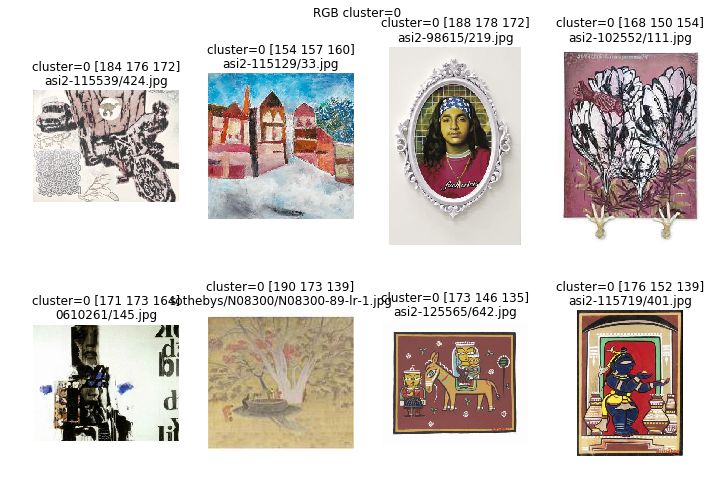

In [18]:
df_rgb_km_groups = df_rgb_km.groupby('cluster')
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[0]].sample(16),0)

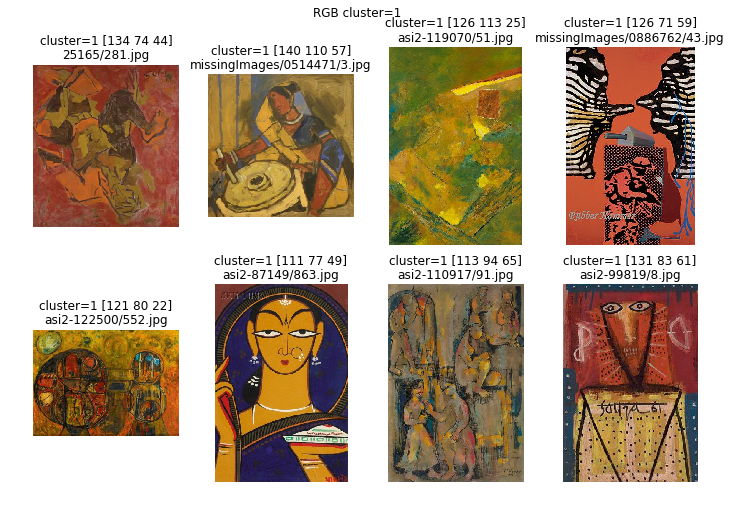

In [19]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[1]].sample(16),1)

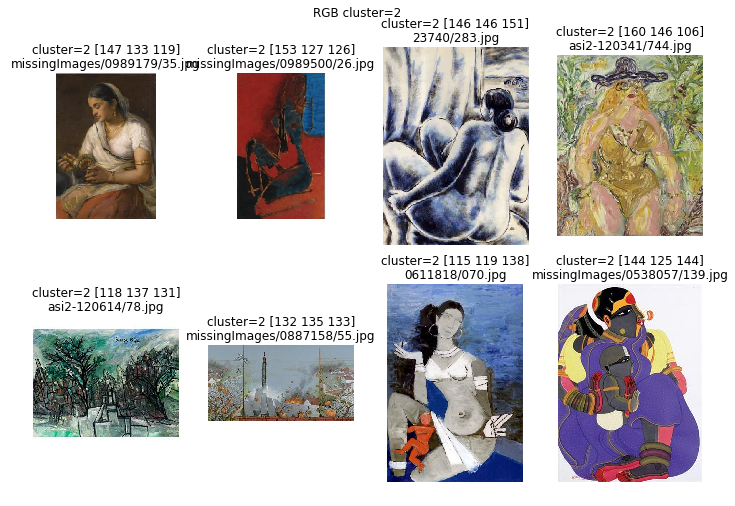

In [20]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[2]].sample(16),2)

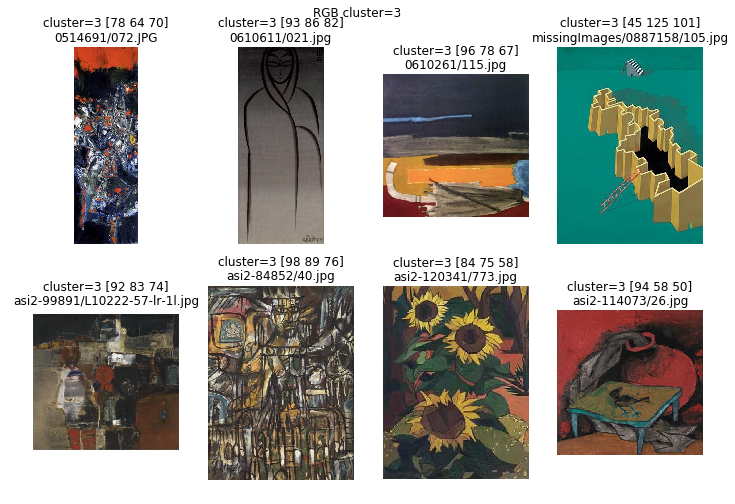

In [21]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[3]].sample(16),3)

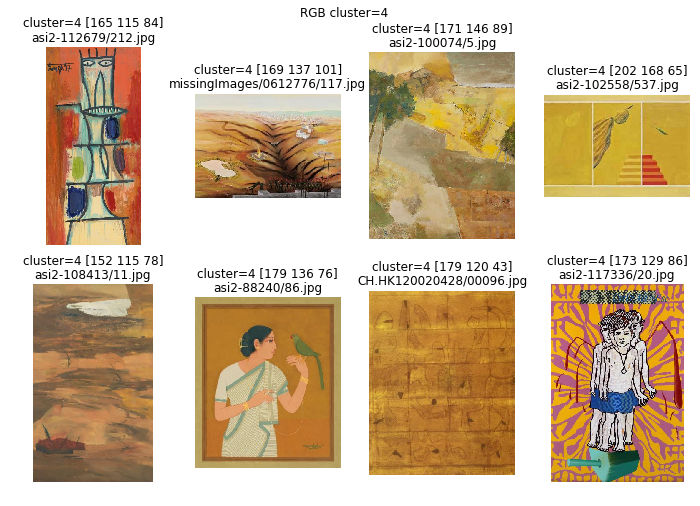

In [22]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[4]].sample(16),4)

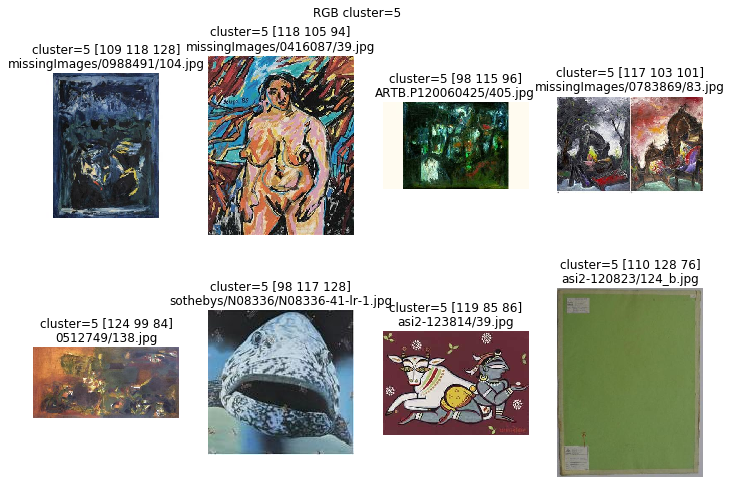

In [23]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[5]].sample(16),5)

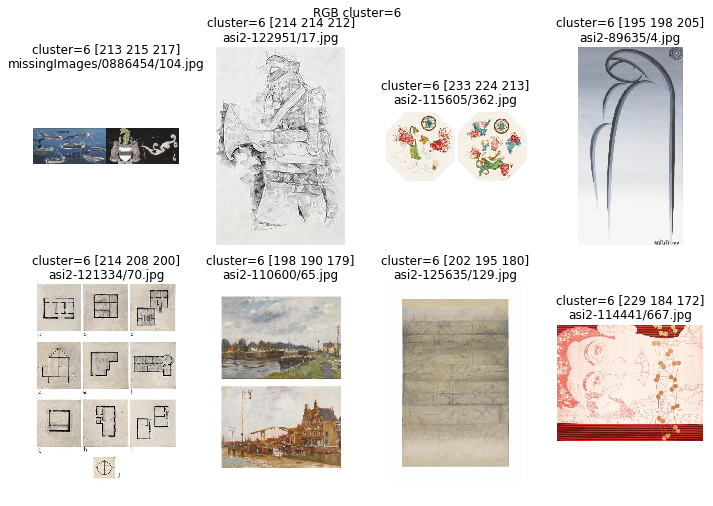

In [24]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[6]].sample(16),6)

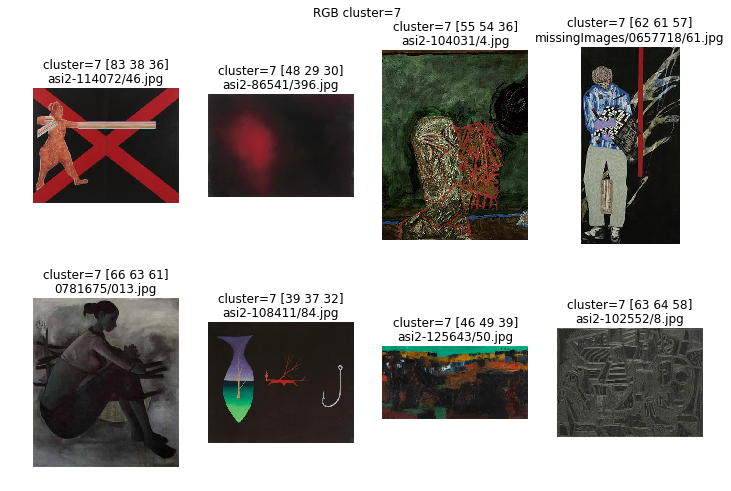

In [25]:
_imshow_rgb(df_rgb_km.loc[df_rgb_km_groups.groups[7]].sample(16),7)

## HSV Cluster

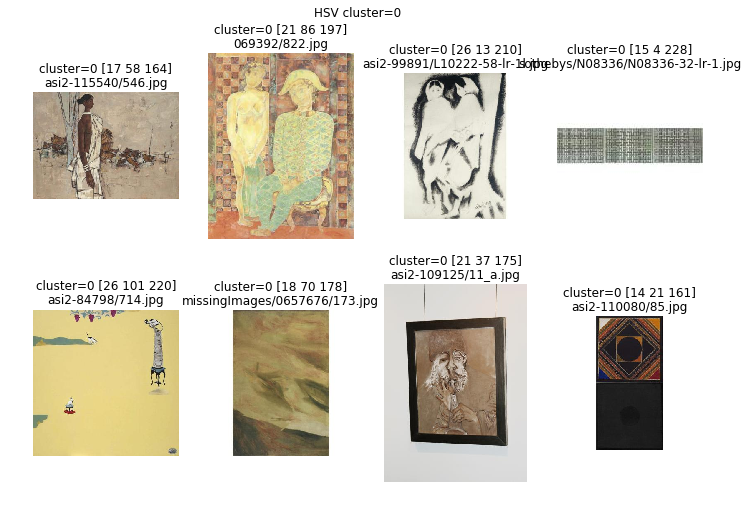

In [26]:
df_hsv_km_groups = df_hsv_km.groupby('cluster')
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[0]].sample(16),0)

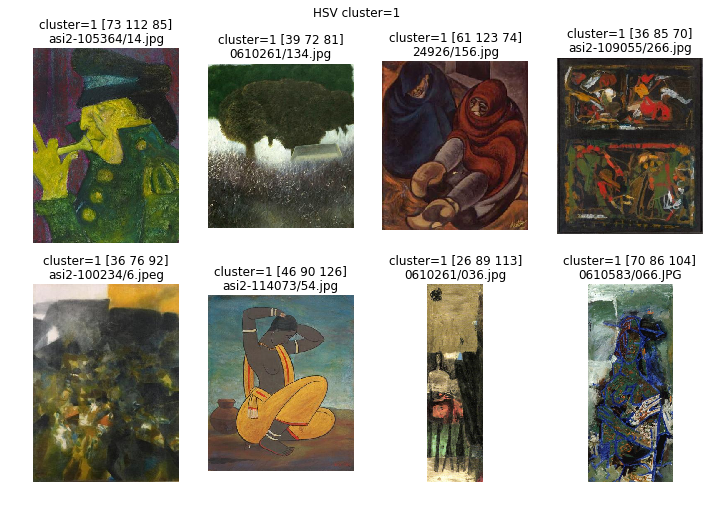

In [27]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[1]].sample(16),1)

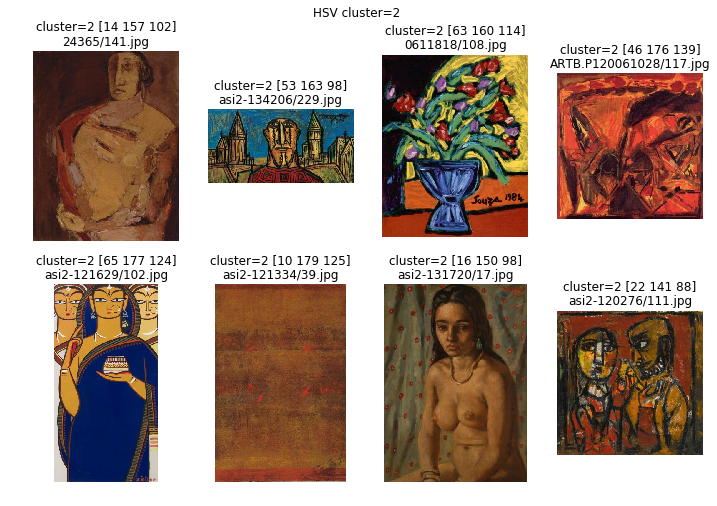

In [28]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[2]].sample(16),2)

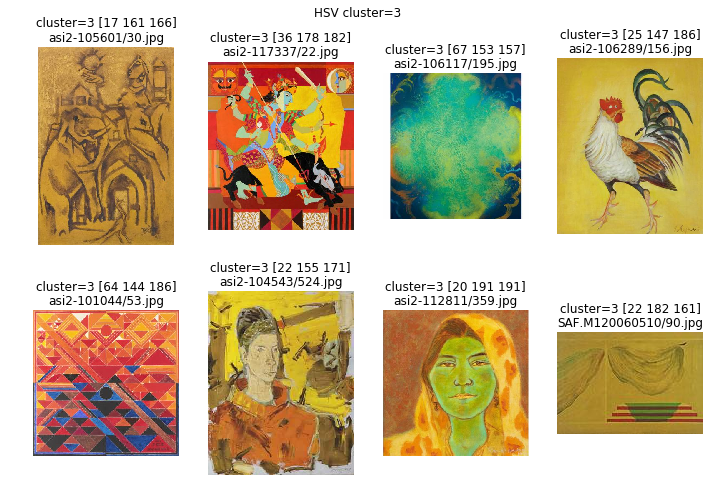

In [29]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[3]].sample(16),3)

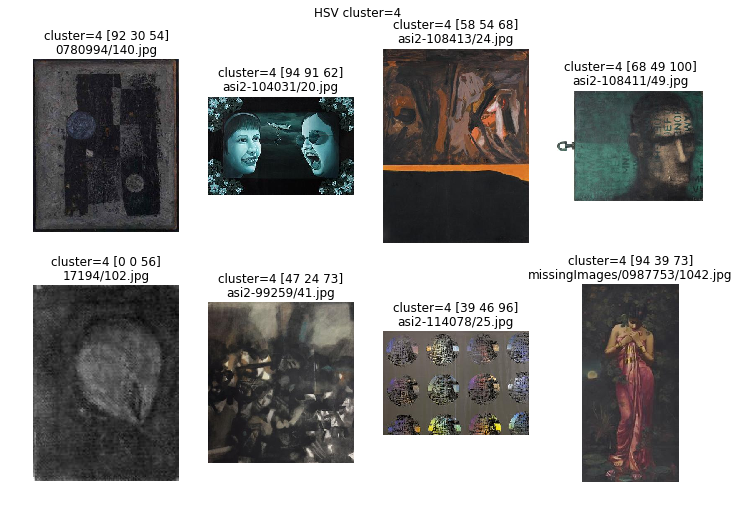

In [30]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[4]].sample(16),4)

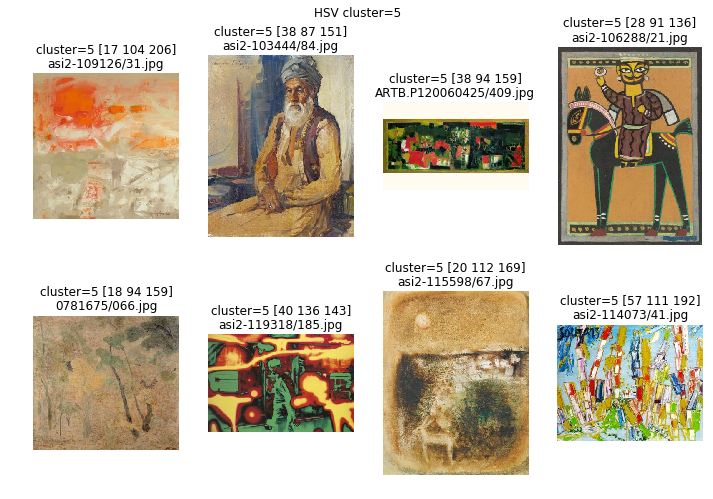

In [31]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[5]].sample(16),5)

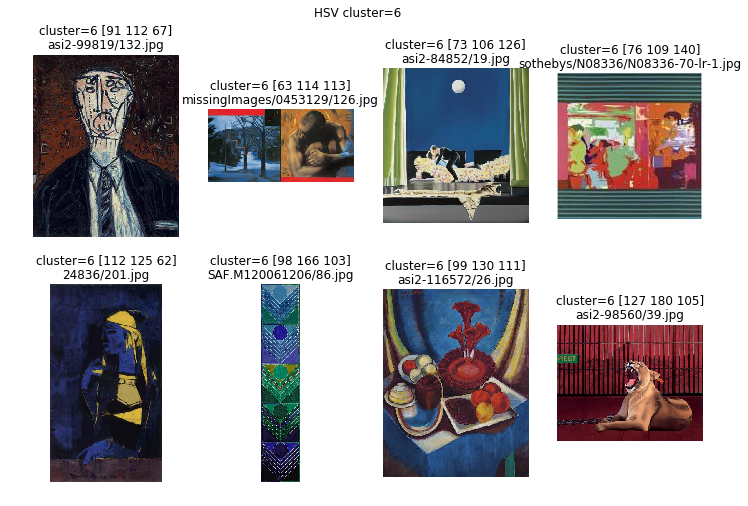

In [32]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[6]].sample(16),6)

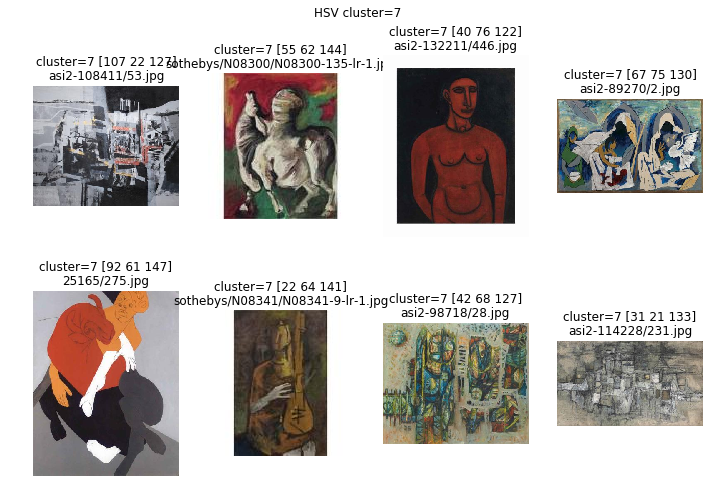

In [33]:
_imshow_hsv(df_hsv_km.loc[df_hsv_km_groups.groups[7]].sample(16),7)

## LAB Cluster

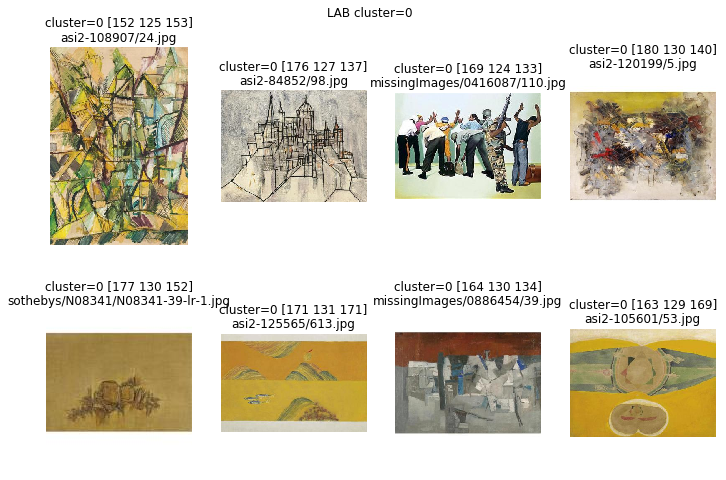

In [34]:
df_lab_km_groups = df_lab_km.groupby('cluster')
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[0]].sample(16),0)

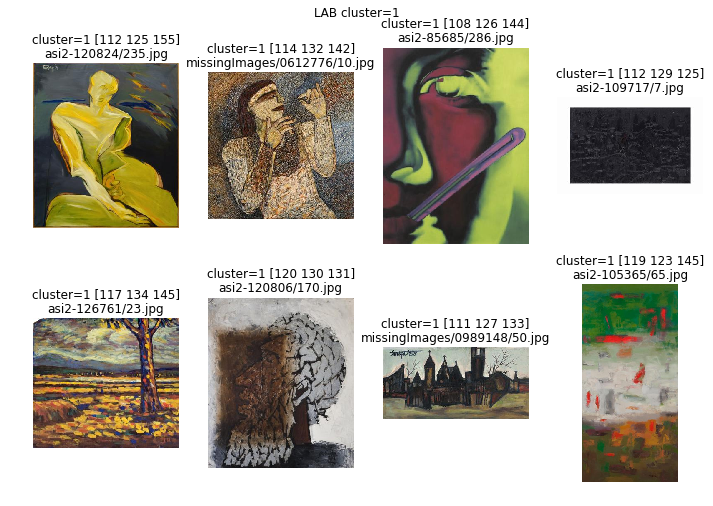

In [35]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[1]].sample(16),1)

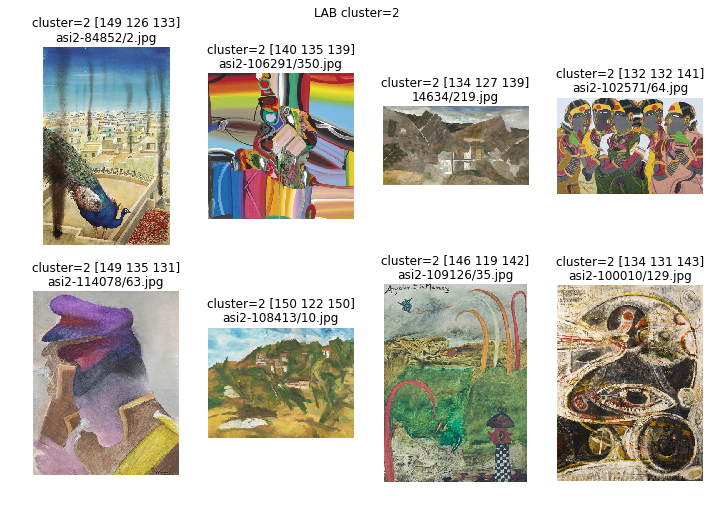

In [36]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[2]].sample(16),2)

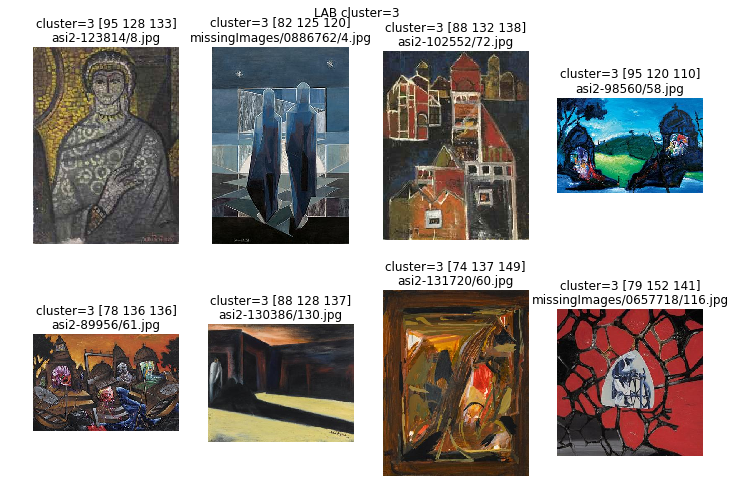

In [37]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[3]].sample(16),3)

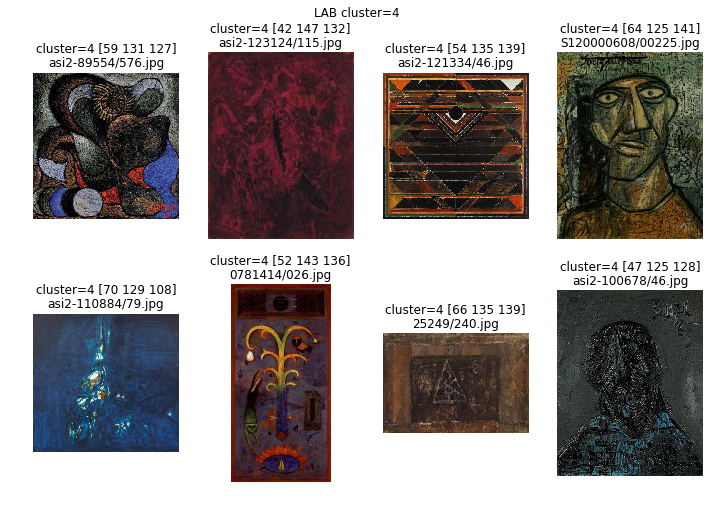

In [38]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[4]].sample(16),4)

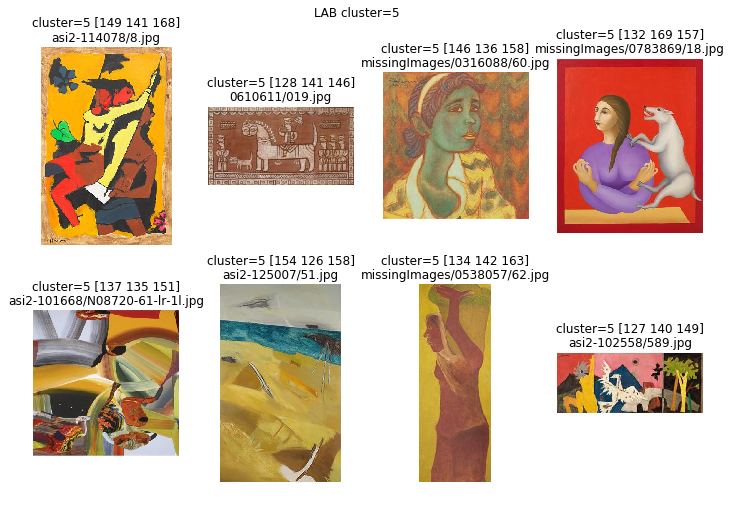

In [39]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[5]].sample(16),5)

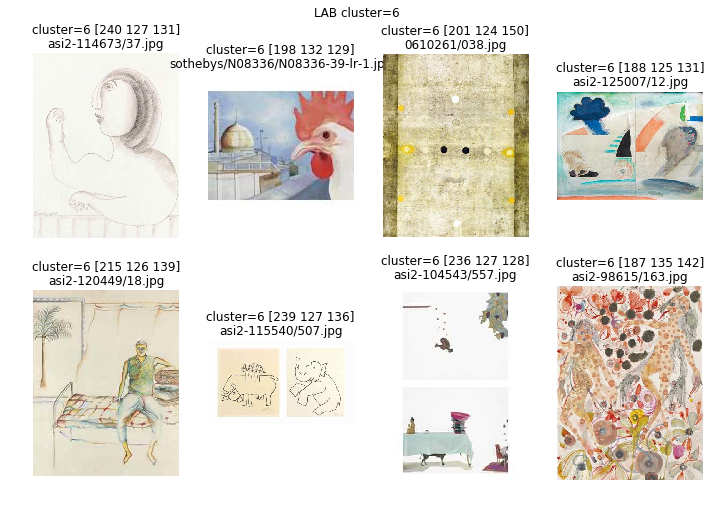

In [40]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[6]].sample(16),6)

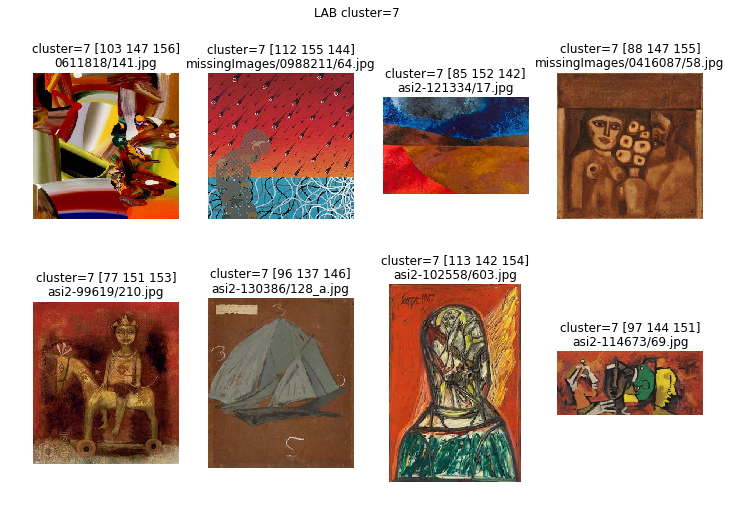

In [41]:
_imshow_lab(df_lab_km.loc[df_lab_km_groups.groups[7]].sample(16),7)